In [2]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [ ]:
import sys
print(sys.version)
# ----------------------[alternative]---
!python --version

3.7.13 (default, Apr 24 2022, 01:04:09) 
[GCC 7.5.0]
Python 3.7.13


In [3]:
%cd gdrive/MyDrive/Datasets/Cancer

/content/gdrive/MyDrive/Datasets/Cancer


# Split Dataset

In [ ]:
!pip install splitfolders

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
ERROR: Could not find a version that satisfies the requirement splitfolders (from versions: none)
ERROR: No matching distribution found for splitfolders


In [ ]:
import splitfolders
splitfolders.ratio("Kather_texture_2016_image_tiles_5000", output="output",
    seed=1337, ratio=(.8, .1, .1), group_prefix=None, move=False)

# Import and Parameters

In [4]:
from glob import glob
import numpy as np
import cv2
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split
import tensorflow as tf

import pandas as pd
from sklearn.utils.multiclass import unique_labels
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import seaborn as sns
import itertools
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix
from keras import Sequential
from tensorflow.keras.applications.resnet import ResNet50
from keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import SGD
from tensorflow.keras.optimizers import Adam
from keras.callbacks import ReduceLROnPlateau
from keras.layers import Flatten, Dense, BatchNormalization, Activation,Dropout
import random
from keras import layers
import keras


In [ ]:
!pip install visualkeras


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 992 kB 8.6 MB/s 


In [ ]:
import visualkeras

In [5]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from tensorflow.keras.utils import plot_model
from sklearn import metrics
from sklearn.metrics import classification_report,confusion_matrix,accuracy_score


In [ ]:
from PIL import ImageFont
font = ImageFont.truetype("../arial.ttf", 18)

In [ ]:
import os
print("train-Tumor ",len(os.listdir("output/train/01_TUMOR")))
print("test-Tumor ",len(os.listdir("output/test/01_TUMOR")))
print("val-Tumor ",len(os.listdir("output/val/01_TUMOR")))

print("train-STROMA ",len(os.listdir("output/train/02_STROMA")))

print("test-STROMA ",len(os.listdir("output/test/02_STROMA")))

print("val-STROMA ",len(os.listdir("output/val/02_STROMA")))



train-Tumor  500
test-Tumor  63
val-Tumor  62
train-STROMA  500
test-STROMA  63
val-STROMA  62


In [6]:
train_path = 'output/train'
test_path = 'output/test'
valid_path = 'output/val'

In [7]:


batch_size = 16
img_height = 150 
img_width = 150  

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img

image_gen = ImageDataGenerator(
                                   rescale = 1./255,
                                   shear_range = 0.2,
                                   zoom_range = 0.2,
                                   horizontal_flip = True,
                              
                               )  

test_data_gen = ImageDataGenerator(rescale = 1./255)



train = image_gen.flow_from_directory(
    train_path,
    target_size=(img_height, img_width),
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size
                                      )

test = test_data_gen.flow_from_directory(
      test_path,
      target_size=(img_height, img_width),
      color_mode='rgb',shuffle=False,
      class_mode='categorical',
      batch_size=batch_size
      )
valid = test_data_gen.flow_from_directory(
      valid_path,
      target_size=(img_height, img_width),
      color_mode='rgb',
      class_mode='categorical', 
      batch_size=batch_size
      )

Found 4000 images belonging to 8 classes.
Found 504 images belonging to 8 classes.
Found 496 images belonging to 8 classes.


In [ ]:
train.class_indices

{'01_TUMOR': 0,
 '02_STROMA': 1,
 '03_COMPLEX': 2,
 '04_LYMPHO': 3,
 '05_DEBRIS': 4,
 '06_MUCOSA': 5,
 '07_ADIPOSE': 6,
 '08_EMPTY': 7}

In [12]:
labels = ['TUMOR', 'STROMA', 'COMPLEX', 'LYMPHO', 'DEBRIS', 'MUCOSA',
       'ADIPOSE', 'EMPTY']

# VGG 19

## Model Architectur

In [ ]:
from keras.applications.vgg19 import VGG19


In [ ]:
base_model = VGG19(include_top = False, weights = 'imagenet', input_shape = (150,150,3), classes = np.unique(train.classes))

80150528/80134624 [==============================] - 1s 0us/step


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
from tensorflow.keras import layers 
x = layers.Flatten()(base_model.output)


x = layers.Dense(512, activation='relu')(x)
x = layers.Dense(256, activation='relu')(x)

x = layers.Dropout(0.3)(x)
x = layers.Dense(128, activation='relu')(x)
x = layers.Dropout(0.2)(x)
x = layers.Dense(8, activation='softmax')(x)

model = tf.keras.models.Model(base_model.input, x)




In [ ]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0     

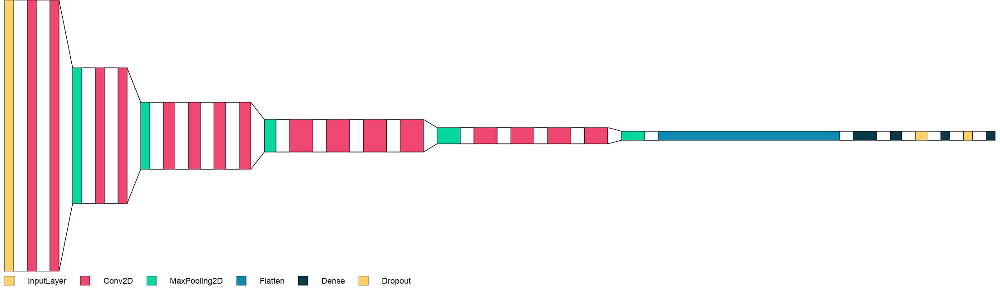

In [ ]:
visualkeras.layered_view(model, legend=True, font=font, draw_volume=False,spacing=30)


## Compile model

In [ ]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])


In [ ]:
lrr= ReduceLROnPlateau(monitor='val_loss', factor=.01,  patience=2, min_lr=1e-5)

In [ ]:
model.fit(train,
                           epochs = 25,
                           validation_data = valid,
                            callbacks = [lrr], verbose=1)

Epoch 1/25
250/250 [==============================] - 1155s 5s/step - loss: 1.0001 - accuracy: 0.6357 - val_loss: 0.5215 - val_accuracy: 0.8044 - lr: 0.0010
Epoch 2/25
250/250 [==============================] - 31s 123ms/step - loss: 0.6206 - accuracy: 0.7812 - val_loss: 0.4010 - val_accuracy: 0.8468 - lr: 0.0010
Epoch 3/25
250/250 [==============================] - 30s 122ms/step - loss: 0.5662 - accuracy: 0.8008 - val_loss: 0.3656 - val_accuracy: 0.8831 - lr: 0.0010
Epoch 4/25
250/250 [==============================] - 30s 121ms/step - loss: 0.5013 - accuracy: 0.8260 - val_loss: 0.3344 - val_accuracy: 0.8649 - lr: 0.0010
Epoch 5/25
250/250 [==============================] - 32s 127ms/step - loss: 0.4392 - accuracy: 0.8440 - val_loss: 0.3384 - val_accuracy: 0.8770 - lr: 0.0010
Epoch 6/25
250/250 [==============================] - 31s 122ms/step - loss: 0.4121 - accuracy: 0.8537 - val_loss: 0.3652 - val_accuracy: 0.8690 - lr: 0.0010
Epoch 7/25
250/250 [==============================] -

##Evaluation

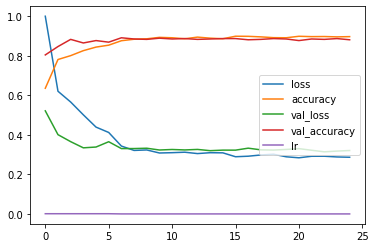

In [ ]:
pd.DataFrame(model.history.history).plot()

In [ ]:
model.save('model-vgg19.h5')

In [ ]:
train_accu = model.evaluate(train)
print('The train accuracy is :',train_accu[1]*100, '%')

250/250 [==============================] - 29s 117ms/step - loss: 0.2676 - accuracy: 0.9000
The train accuracy is : 89.99999761581421 %


In [ ]:
val_accu = model.evaluate(valid)
print('The validation accuracy is :',val_accu[1]*100, '%')

31/31 [==============================] - 2s 52ms/step - loss: 0.3208 - accuracy: 0.8810
The validation accuracy is : 88.10483813285828 %


In [ ]:
test_accu = model.evaluate(test)
print('The testing accuracy is :',test_accu[1]*100, '%')

32/32 [==============================] - 138s 4s/step - loss: 0.3881 - accuracy: 0.8730
The testing accuracy is : 87.30158805847168 %


In [14]:
import keras
model_vgg19 = keras.models.load_model("model-vgg19.h5")

In [15]:
preds = model_vgg19.predict(test,verbose=1)

32/32 [==============================] - 2s 51ms/step


In [16]:
predictions = np.argmax(preds, axis=-1)

In [ ]:

confusion_matrix(test.classes, predictions)

array([[60,  0,  1,  1,  0,  1,  0,  0],
       [ 1, 46, 11,  0,  4,  0,  1,  0],
       [ 5,  3, 46,  6,  2,  1,  0,  0],
       [ 0,  0,  5, 57,  0,  1,  0,  0],
       [ 1,  4,  1,  0, 56,  1,  0,  0],
       [ 4,  0,  2,  2,  0, 55,  0,  0],
       [ 0,  1,  0,  0,  0,  0, 61,  1],
       [ 0,  0,  0,  0,  1,  0,  3, 59]])

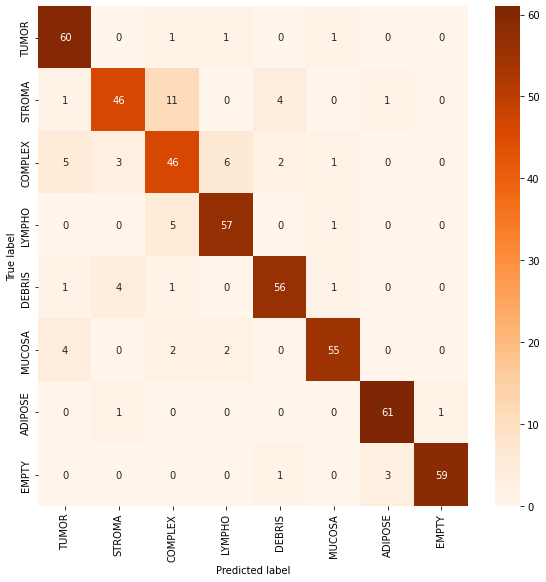

In [ ]:
figure = plt.figure(figsize=(8, 8))

confusion = confusion_matrix(test.classes, predictions)
sns.heatmap(confusion, annot=True,cmap=plt.cm.Oranges,
            xticklabels=labels, yticklabels=labels)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [17]:
from sklearn.metrics import classification_report
print (classification_report(test.classes, predictions, target_names=labels))

              precision    recall  f1-score   support

       TUMOR       0.85      0.95      0.90        63
      STROMA       0.85      0.73      0.79        63
     COMPLEX       0.70      0.73      0.71        63
      LYMPHO       0.86      0.90      0.88        63
      DEBRIS       0.89      0.89      0.89        63
      MUCOSA       0.93      0.87      0.90        63
     ADIPOSE       0.94      0.97      0.95        63
       EMPTY       0.98      0.94      0.96        63

    accuracy                           0.87       504
   macro avg       0.88      0.87      0.87       504
weighted avg       0.88      0.87      0.87       504



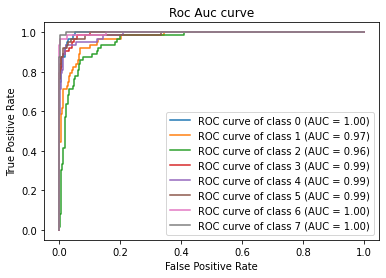

In [ ]:

import pandas as pd
from sklearn.metrics import auc, roc_auc_score, roc_curve, confusion_matrix, classification_report
y_test = pd.get_dummies(pd.Series(test.classes))
y_test = y_test.to_numpy()
num_classes = 8
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

for i in range(num_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc[i]))
plt.title("Roc Auc curve")
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
FP = confusion.sum(axis=0) - np.diag(confusion) 
FN = confusion.sum(axis=1) - np.diag(confusion) 
TP = np.diag(confusion) 
TN = confusion.sum() - (FP + FN + TP)
FP = FP.astype(float) 
FN = FN.astype(float) 
TP = TP.astype(float) 
TN = TN.astype(float)

In [ ]:
  import math 
  from sklearn.metrics import matthews_corrcoef
 



  specificity = TN / (TN + FP)

  false_positive_rate = FP / (TN + FP)


  MCC =matthews_corrcoef(test.classes, predictions)

  Recall = TP / (FN + TP)

  NPV  = TN / (TN+FN)
  data = roc_auc.items()
  roc = list(data)
  roc = np.array(roc)
 

  print("Specificity : {:.2%}".format(sum(specificity)/len(specificity)))
  print("--------------------------------------")

  print("False Positive Rate: {:.2%}".format(1 - sum(specificity)/8))
  print("--------------------------------------")

  print("Sensitivity: {:.2%}".format(metrics.recall_score(test.classes, predictions, average="macro")))
  print("--------------------------------------")

  print("Precision : {:.2%}".format(metrics.precision_score(test.classes, predictions, average="macro" )))
  print("--------------------------------------")

  print("Recall : {:.2}".format(sum(Recall)/8))
  print("--------------------------------------")
  print("F1-Score : {:.2%}".format(metrics.f1_score(test.classes, predictions,average="macro")))
  print("--------------------------------------")
  print("Area under ROC : {:.3}".format( sum(roc[:,1])/8))
  print("--------------------------------------")
  print("Matthews Correlation Coefficient : {:.2}".format(MCC))
  print("--------------------------------------")
  print("Negative Predictive Value  : {:.2}".format(sum(NPV)/8))
  print("--------------------------------------")


Specificity : 98.19%
--------------------------------------
False Positive Rate: 1.81%
--------------------------------------
Sensitivity: 87.30%
--------------------------------------
Precision : 87.51%
--------------------------------------
Recall : 0.87
--------------------------------------
F1-Score : 87.27%
--------------------------------------
Area under ROC : 0.987
--------------------------------------
Matthews Correlation Coefficient : 0.86
--------------------------------------
Negative Predictive Value  : 0.98
--------------------------------------


In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)

(504, 150, 150, 3)
(504, 8)


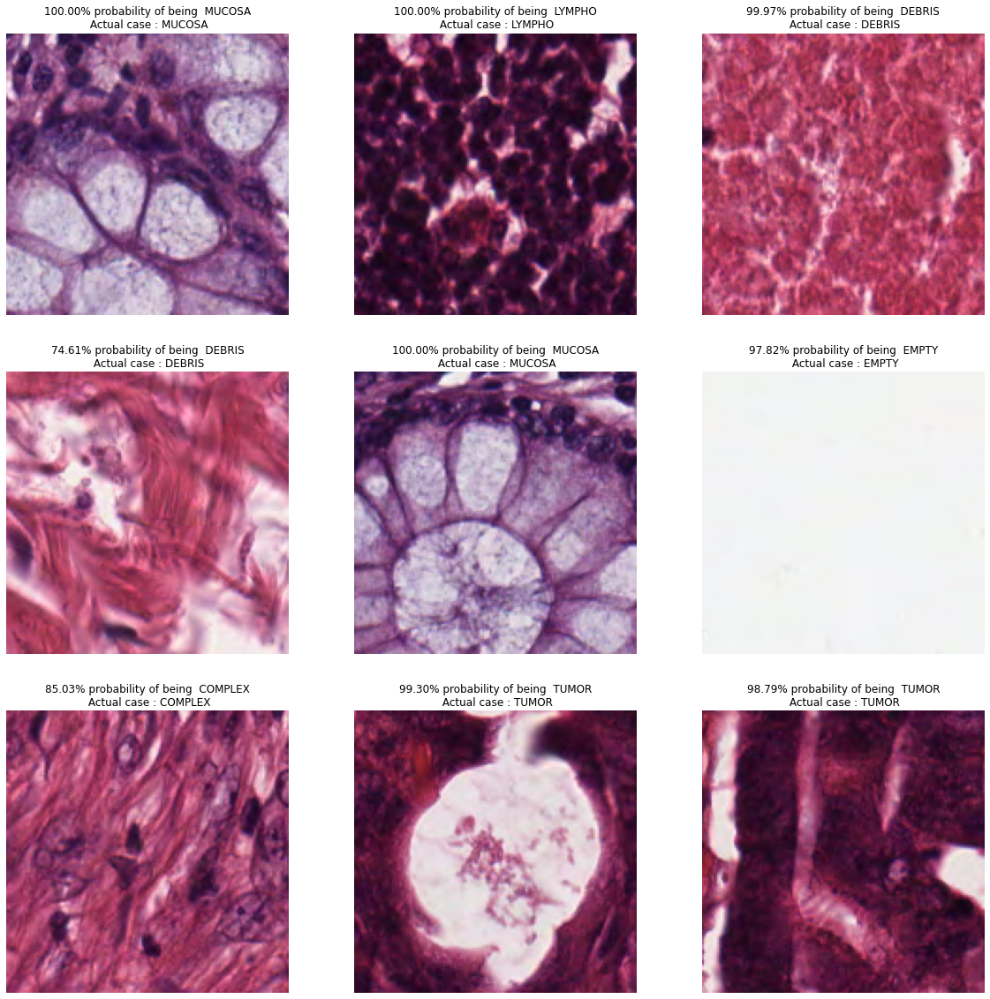

In [ ]:
dic =  {0:'TUMOR', 1:'STROMA', 2:'COMPLEX', 3:'LYMPHO', 4:'DEBRIS', 5:'MUCOSA',
       6:'ADIPOSE', 7:'EMPTY'}
plt.figure(figsize=(20,20))
c = 1
for i in random.sample(range(0, 503), 9):
  
  plt.subplot(3, 3, c)
  c+=1
  for j in range(0,8):
    if y[i][j] == 1:
      
      p = ('{:.2%} probability of being  '.format(preds[i][j])+str(dic.get(predictions[i])))
      actual = ("\n Actual case : "+ str(dic.get(j)))
  plt.title(p + actual)    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
 
      
      

plt.savefig('vgg19-prediction-images.png')  
plt.show()

# Res-Net50

## Model Architecture

In [ ]:
base_model = ResNet50(include_top = False, weights = 'imagenet', input_shape = (150,150,3), classes = np.unique(train.classes))

In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
model_resnet=Sequential()

model_resnet.add(base_model)
model_resnet.add(Flatten())

model_resnet.add(Dense(1024,activation=('relu'),input_dim=512))
model_resnet.add(Dense(512,activation=('relu'))) 
model_resnet.add(Dropout(.4))
model_resnet.add(Dense(256,activation=('relu'))) 
model_resnet.add(Dropout(.3))
model_resnet.add(Dense(128,activation=('relu')))
model_resnet.add(Dropout(.2))
model_resnet.add(Dense(8,activation=('softmax')))

#Summary of ResNet50 Model
model_resnet.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 5, 5, 2048)        23587712  
                                                                 
 flatten_2 (Flatten)         (None, 51200)             0         
                                                                 
 dense (Dense)               (None, 1024)              52429824  
                                                                 
 dense_1 (Dense)             (None, 512)               524800    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 256)               131328    
                                                                 
 dropout_1 (Dropout)         (None, 256)              

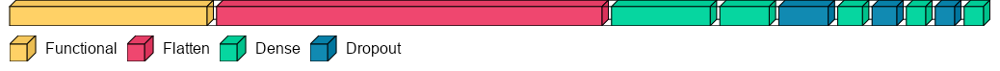

In [ ]:
visualkeras.layered_view(model_resnet, legend=True)

visualkeras.layered_view(model_resnet, legend=True, font=font) 


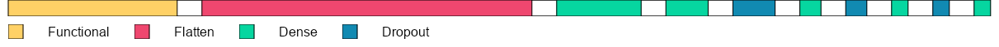

In [ ]:
visualkeras.layered_view(model_resnet, legend=True, font=font, draw_volume=False,spacing=30)


## Compile model

In [ ]:
model_resnet.compile(optimizer = 'SGD', loss = 'categorical_crossentropy', metrics = ['accuracy'])


In [ ]:
lrr= ReduceLROnPlateau(monitor='val_loss', factor=.01,  patience=2, min_lr=1e-5)

In [ ]:
model_resnet.fit(train,
                           epochs = 25,
                           validation_data = valid,
                            callbacks = [lrr], verbose=1)

Epoch 1/25
250/250 [==============================] - 948s 4s/step - loss: 1.1196 - accuracy: 0.6227 - val_loss: 2.9305 - val_accuracy: 0.1250 - lr: 0.0100
Epoch 2/25
250/250 [==============================] - 37s 147ms/step - loss: 0.5437 - accuracy: 0.8270 - val_loss: 2.1071 - val_accuracy: 0.2218 - lr: 0.0100
Epoch 3/25
250/250 [==============================] - 36s 145ms/step - loss: 0.4141 - accuracy: 0.8677 - val_loss: 1.3881 - val_accuracy: 0.5383 - lr: 0.0100
Epoch 4/25
250/250 [==============================] - 36s 145ms/step - loss: 0.3489 - accuracy: 0.8947 - val_loss: 0.5606 - val_accuracy: 0.8165 - lr: 0.0100
Epoch 5/25
250/250 [==============================] - 36s 145ms/step - loss: 0.3140 - accuracy: 0.9018 - val_loss: 0.2139 - val_accuracy: 0.9294 - lr: 0.0100
Epoch 6/25
250/250 [==============================] - 36s 146ms/step - loss: 0.2841 - accuracy: 0.9137 - val_loss: 0.2915 - val_accuracy: 0.9214 - lr: 0.0100
Epoch 7/25
250/250 [==============================] - 

In [ ]:
model_resnet.save("model-resnet.h5")

## Evaluation

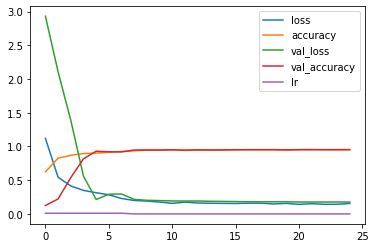

In [ ]:
import pandas as pd
pd.DataFrame(model_resnet.history.history).plot()

In [ ]:
import keras
model_resnet = keras.models.load_model("model-resnet.h5")

In [ ]:
train_accu = model_resnet.evaluate(train)
print('The training accuracy is :',train_accu[1]*100, '%')

250/250 [==============================] - 2086s 8s/step - loss: 0.0591 - accuracy: 0.9815
The training accuracy is : 98.15000295639038 %


In [ ]:
val_accu = model_resnet.evaluate(valid)
print('The validation accuracy is :',val_accu[1]*100, '%')

31/31 [==============================] - 248s 8s/step - loss: 0.1760 - accuracy: 0.9536
The validation accuracy is : 95.36290168762207 %


In [ ]:
test_accu = model_resnet.evaluate(test)
print('The testing accuracy is :',test_accu[1]*100, '%')

32/32 [==============================] - 267s 8s/step - loss: 0.1915 - accuracy: 0.9504
The testing accuracy is : 95.03968358039856 %


In [ ]:
preds = model_resnet.predict(test,verbose=1)

32/32 [==============================] - 145s 5s/step


In [ ]:
predictions = np.argmax(preds, axis=-1)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(test.classes, predictions)

array([[63,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 56,  4,  1,  1,  0,  1,  0],
       [ 5,  3, 51,  4,  0,  0,  0,  0],
       [ 0,  0,  1, 62,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 63,  0,  0,  0],
       [ 1,  0,  0,  2,  0, 60,  0,  0],
       [ 0,  1,  0,  0,  1,  0, 61,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 63]])

In [ ]:
labels = ['TUMOR', 'STROMA', 'COMPLEX', 'LYMPHO', 'DEBRIS', 'MUCOSA',
       'ADIPOSE', 'EMPTY']


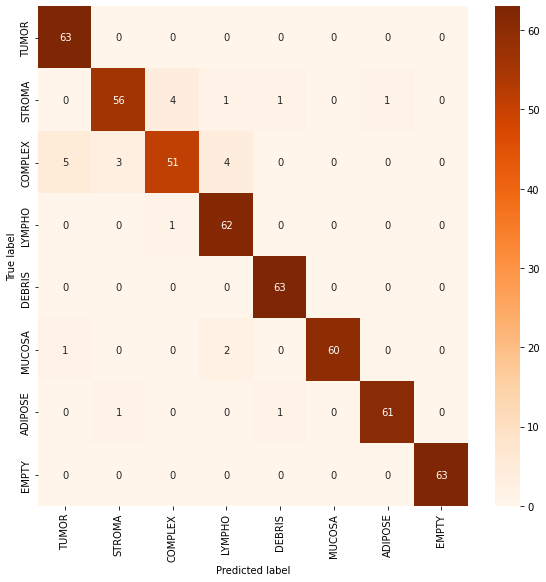

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
figure = plt.figure(figsize=(8, 8))

confusion = confusion_matrix(test.classes, predictions)
sns.heatmap(confusion, annot=True,cmap=plt.cm.Oranges,
            xticklabels=labels, yticklabels=labels)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [ ]:
FP = confusion.sum(axis=0) - np.diag(confusion) 
FN = confusion.sum(axis=1) - np.diag(confusion) 
TP = np.diag(confusion) 
TN = confusion.sum() - (FP + FN + TP)
FP = FP.astype(float) 
FN = FN.astype(float) 
TP = TP.astype(float) 
TN = TN.astype(float)

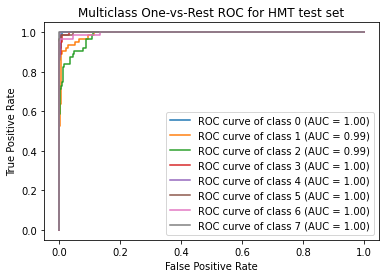

In [ ]:

import pandas as pd
from sklearn.metrics import auc, roc_auc_score, roc_curve, confusion_matrix, classification_report
y_test = pd.get_dummies(pd.Series(test.classes))
y_test = y_test.to_numpy()
num_classes = 8
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

for i in range(num_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc[i]))
plt.title("Multiclass One-vs-Rest ROC for HMT test set")
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
  import math 
  from sklearn.metrics import matthews_corrcoef
 



  specificity = TN / (TN + FP)

  false_positive_rate = FP / (TN + FP)


  MCC =matthews_corrcoef(test.classes, predictions)

  Recall = TP / (FN + TP)

  NPV  = TN / (TN+FN)
  data = roc_auc.items()
  roc = list(data)
  roc = np.array(roc)
 

  print("Specificity : {:.2%}".format(sum(specificity)/len(specificity)))
  print("--------------------------------------")

  print("False Positive Rate: {:.2%}".format(1 - sum(specificity)/8))
  print("--------------------------------------")

  print("Sensitivity: {:.2%}".format(metrics.recall_score(test.classes, predictions, average="macro")))
  print("--------------------------------------")

  print("Precision : {:.2%}".format(metrics.precision_score(test.classes, predictions, average="macro" )))
  print("--------------------------------------")

  print("Recall : {:.2}".format(sum(Recall)/8))
  print("--------------------------------------")
  print("F1-Score : {:.2%}".format(metrics.f1_score(test.classes, predictions,average="macro")))
  print("--------------------------------------")
  print("Area under ROC : {:.3}".format( sum(roc[:,1])/8))
  print("--------------------------------------")
  print("Matthews Correlation Coefficient : {:.2}".format(MCC))
  print("--------------------------------------")
  print("Negative Predictive Value  : {:.2}".format(sum(NPV)/8))
  print("--------------------------------------")


Specificity : 99.29%
--------------------------------------
False Positive Rate: 0.71%
--------------------------------------
Sensitivity: 95.04%
--------------------------------------
Precision : 95.11%
--------------------------------------
Recall : 0.95
--------------------------------------
F1-Score : 94.97%
--------------------------------------
Area under ROC : 0.997
--------------------------------------
Matthews Correlation Coefficient : 0.94
--------------------------------------
Negative Predictive Value  : 0.99
--------------------------------------


In [ ]:
from sklearn.metrics import classification_report
print (classification_report(test.classes, predictions, target_names=labels))

              precision    recall  f1-score   support

       TUMOR       0.91      1.00      0.95        63
      STROMA       0.93      0.89      0.91        63
     COMPLEX       0.91      0.81      0.86        63
      LYMPHO       0.90      0.98      0.94        63
      DEBRIS       0.97      1.00      0.98        63
      MUCOSA       1.00      0.95      0.98        63
     ADIPOSE       0.98      0.97      0.98        63
       EMPTY       1.00      1.00      1.00        63

    accuracy                           0.95       504
   macro avg       0.95      0.95      0.95       504
weighted avg       0.95      0.95      0.95       504



In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)

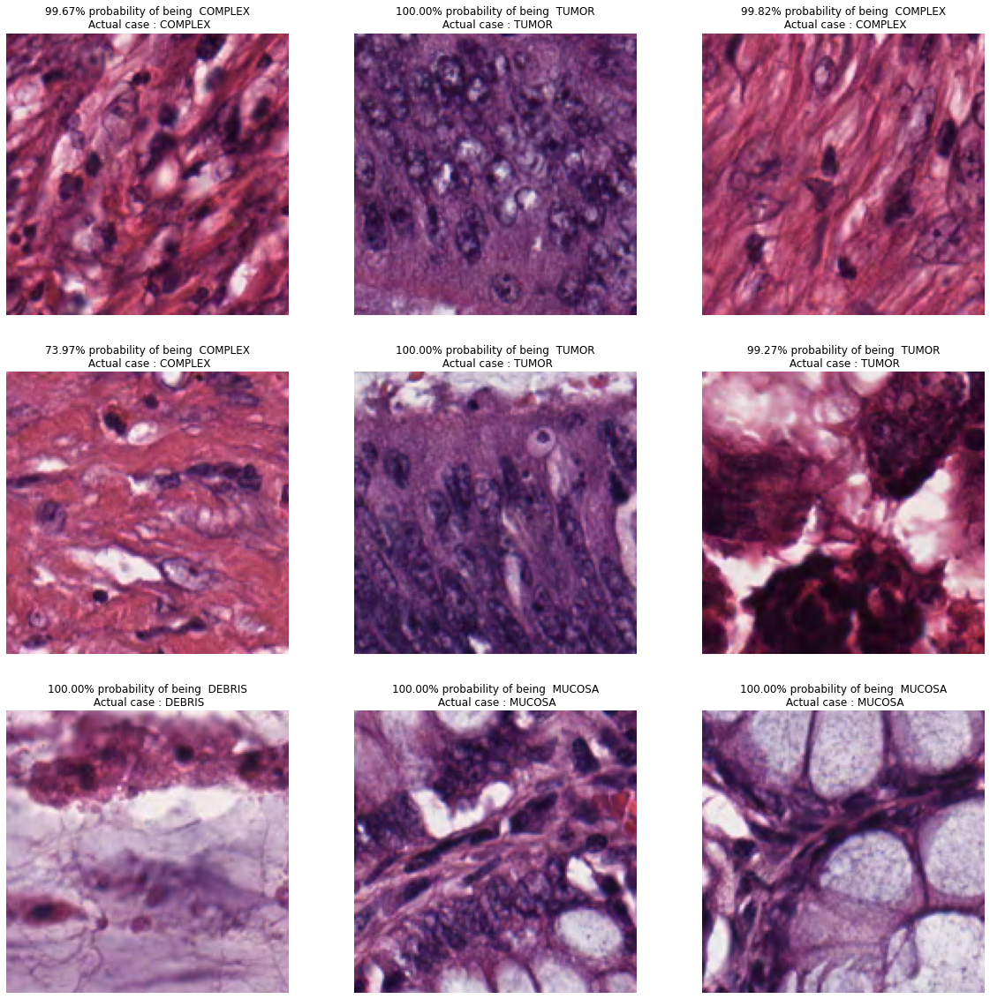

In [ ]:
dic =  {0:'TUMOR', 1:'STROMA', 2:'COMPLEX', 3:'LYMPHO', 4:'DEBRIS', 5:'MUCOSA',
       6:'ADIPOSE', 7:'EMPTY'}
plt.figure(figsize=(20,20))
c = 1
for i in random.sample(range(0, 503), 9):
  
  plt.subplot(3, 3, c)
  c+=1
  for j in range(0,8):
    if y[i][j] == 1:
      
      p = ('{:.2%} probability of being  '.format(preds[i][j])+str(dic.get(predictions[i])))
      actual = ("\n Actual case : "+ str(dic.get(j)))
  plt.title(p + actual)    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
 
      
      

plt.savefig('renset-prediction-images.png')  
plt.show()

# VGG-16

## Model Architecture

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16


In [ ]:
for layer in base_model.layers:
    layer.trainable = False

In [ ]:
from tensorflow.keras import layers 
x = layers.Flatten()(base_model.output)

x = layers.Dense(512, activation='relu')(x)

x = layers.Dropout(0.5)(x)

x = layers.Dense(8, activation='softmax')(x)

model_vgg16 = tf.keras.models.Model(base_model.input, x)

model_vgg16.compile(optimizer = tf.keras.optimizers.RMSprop(lr=0.0001), loss = 'binary_crossentropy',metrics = ['acc'])



/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/rmsprop.py:130: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(RMSprop, self).__init__(name, **kwargs)


In [ ]:
model_vgg16.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 150, 150, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 150, 150, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 150, 150, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 75, 75, 64)        0         
                                                                 
 block2_conv1 (Conv2D)       (None, 75, 75, 128)       73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 75, 75, 128)       147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 37, 37, 128)       0   

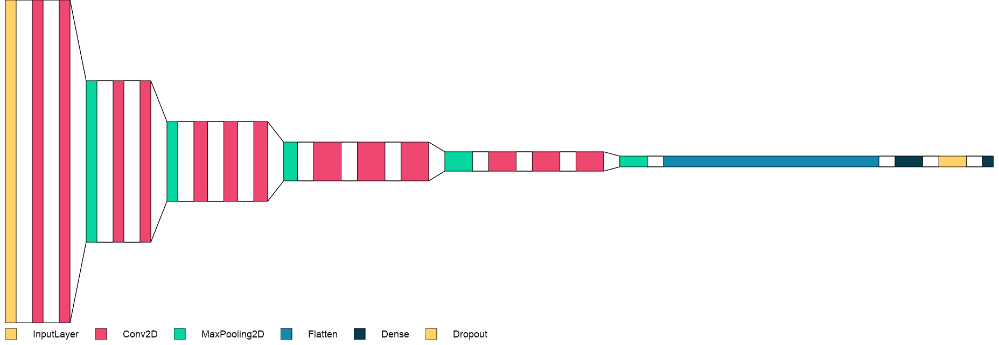

In [ ]:
visualkeras.layered_view(model_vgg16, legend=True, font=font, draw_volume=False,spacing=30)


## Compile model

In [ ]:

model_vgg16.fit(train, validation_data = valid,  epochs = 25)


Epoch 1/25
250/250 [==============================] - 34s 130ms/step - loss: 0.2159 - acc: 0.6420 - val_loss: 0.1324 - val_acc: 0.8145
Epoch 2/25
250/250 [==============================] - 34s 135ms/step - loss: 0.1471 - acc: 0.7768 - val_loss: 0.1222 - val_acc: 0.8105
Epoch 3/25
250/250 [==============================] - 33s 132ms/step - loss: 0.1266 - acc: 0.8108 - val_loss: 0.0970 - val_acc: 0.8690
Epoch 4/25
250/250 [==============================] - 32s 129ms/step - loss: 0.1150 - acc: 0.8360 - val_loss: 0.1021 - val_acc: 0.8548
Epoch 5/25
250/250 [==============================] - 32s 128ms/step - loss: 0.1093 - acc: 0.8432 - val_loss: 0.0911 - val_acc: 0.8609
Epoch 6/25
250/250 [==============================] - 36s 144ms/step - loss: 0.1017 - acc: 0.8525 - val_loss: 0.0864 - val_acc: 0.8891
Epoch 7/25
250/250 [==============================] - 34s 134ms/step - loss: 0.0968 - acc: 0.8568 - val_loss: 0.0872 - val_acc: 0.8770
Epoch 8/25
250/250 [==============================] - 3

## Evaluation

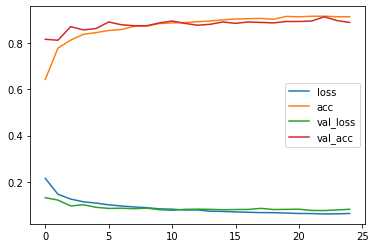

In [ ]:

pd.DataFrame(model_vgg16.history.history).plot()

In [ ]:
train_accu = model_vgg16.evaluate(train)
print('The training accuracy is :',train_accu[1]*100, '%')

250/250 [==============================] - 32s 127ms/step - loss: 0.0513 - acc: 0.9312
The training accuracy is : 93.12499761581421 %


In [ ]:
val_accu = model_vgg16.evaluate(valid)
print('The validation accuracy is :',val_accu[1]*100, '%')

31/31 [==============================] - 2s 59ms/step - loss: 0.0826 - acc: 0.8871
The validation accuracy is : 88.70967626571655 %


In [ ]:
test_accu = model_vgg16.evaluate(test)
print('The testing accuracy is :',test_accu[1]*100, '%')

32/32 [==============================] - 2s 45ms/step - loss: 0.0792 - acc: 0.8770
The testing accuracy is : 87.69841194152832 %


In [ ]:
import keras
model_vgg16.save('vgg16-model.h5')

In [9]:
model_vgg16 = keras.models.load_model('vgg16-model.h5')

In [10]:
preds = model_vgg16.predict(test,verbose=1)

32/32 [==============================] - 155s 5s/step


In [11]:
predictions = np.argmax(preds, axis=-1)

In [ ]:

confusion_matrix(test.classes, predictions)

array([[63,  0,  0,  0,  0,  0,  0,  0],
       [ 0, 56,  4,  1,  1,  0,  1,  0],
       [ 5,  3, 51,  4,  0,  0,  0,  0],
       [ 0,  0,  1, 62,  0,  0,  0,  0],
       [ 0,  0,  0,  0, 63,  0,  0,  0],
       [ 1,  0,  0,  2,  0, 60,  0,  0],
       [ 0,  1,  0,  0,  1,  0, 61,  0],
       [ 0,  0,  0,  0,  0,  0,  0, 63]])

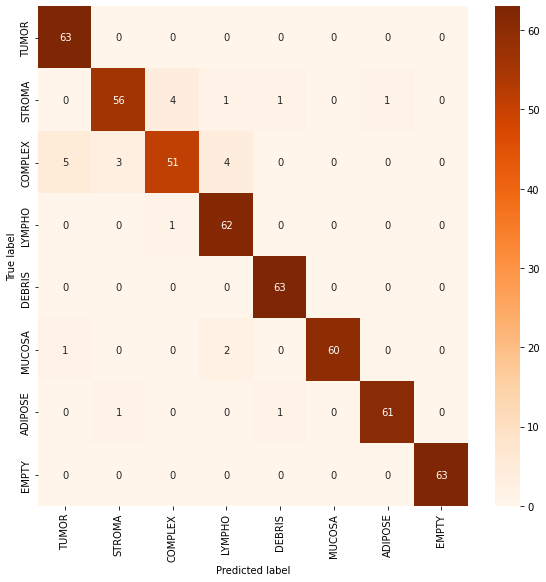

In [ ]:
figure = plt.figure(figsize=(8, 8))

confusion = confusion_matrix(test.classes, predictions)
sns.heatmap(confusion, annot=True,cmap=plt.cm.Oranges,
            xticklabels=labels, yticklabels=labels)
plt.tight_layout()
plt.ylabel('True label')
plt.xlabel('Predicted label')
plt.show()

In [13]:
from sklearn.metrics import classification_report
print (classification_report(test.classes, predictions, target_names=labels))

              precision    recall  f1-score   support

       TUMOR       0.75      1.00      0.86        63
      STROMA       0.83      0.83      0.83        63
     COMPLEX       0.78      0.62      0.69        63
      LYMPHO       0.87      0.92      0.89        63
      DEBRIS       0.91      0.84      0.88        63
      MUCOSA       0.96      0.86      0.91        63
     ADIPOSE       0.97      0.97      0.97        63
       EMPTY       0.98      0.98      0.98        63

    accuracy                           0.88       504
   macro avg       0.88      0.88      0.88       504
weighted avg       0.88      0.88      0.88       504



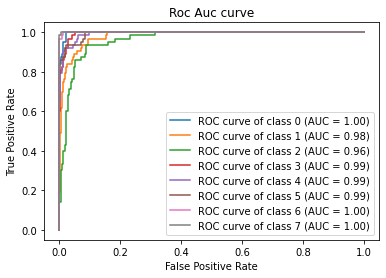

In [ ]:

import pandas as pd
from sklearn.metrics import auc, roc_auc_score, roc_curve, confusion_matrix, classification_report
y_test = pd.get_dummies(pd.Series(test.classes))
y_test = y_test.to_numpy()
num_classes = 8
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(num_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], preds[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

for i in range(num_classes):
    plt.plot(fpr[i], tpr[i],
             label='ROC curve of class {0} (AUC = {1:0.2f})'
             ''.format(i, roc_auc[i]))
plt.title("Roc Auc curve")
plt.legend(loc='best')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.show()

In [ ]:
FP = confusion.sum(axis=0) - np.diag(confusion) 
FN = confusion.sum(axis=1) - np.diag(confusion) 
TP = np.diag(confusion) 
TN = confusion.sum() - (FP + FN + TP)
FP = FP.astype(float) 
FN = FN.astype(float) 
TP = TP.astype(float) 
TN = TN.astype(float)

In [ ]:
  import math 
  from sklearn.metrics import matthews_corrcoef
 



  specificity = TN / (TN + FP)

  false_positive_rate = FP / (TN + FP)


  MCC =matthews_corrcoef(test.classes, predictions)

  Recall = TP / (FN + TP)

  NPV  = TN / (TN+FN)
  data = roc_auc.items()
  roc = list(data)
  roc = np.array(roc)
 

  print("Specificity : {:.2%}".format(sum(specificity)/len(specificity)))
  print("--------------------------------------")

  print("False Positive Rate: {:.2%}".format(1 - sum(specificity)/8))
  print("--------------------------------------")

  print("Sensitivity: {:.2%}".format(metrics.recall_score(test.classes, predictions, average="macro")))
  print("--------------------------------------")

  print("Precision : {:.2%}".format(metrics.precision_score(test.classes, predictions, average="macro" )))
  print("--------------------------------------")

  print("Recall : {:.2}".format(sum(Recall)/8))
  print("--------------------------------------")
  print("F1-Score : {:.2%}".format(metrics.f1_score(test.classes, predictions,average="macro")))
  print("--------------------------------------")
  print("Area under ROC : {:.3}".format( sum(roc[:,1])/8))
  print("--------------------------------------")
  print("Matthews Correlation Coefficient : {:.2}".format(MCC))
  print("--------------------------------------")
  print("Negative Predictive Value  : {:.2}".format(sum(NPV)/8))
  print("--------------------------------------")


Specificity : 99.29%
--------------------------------------
False Positive Rate: 0.71%
--------------------------------------
Sensitivity: 95.04%
--------------------------------------
Precision : 95.11%
--------------------------------------
Recall : 0.95
--------------------------------------
F1-Score : 94.97%
--------------------------------------
Area under ROC : 0.99
--------------------------------------
Matthews Correlation Coefficient : 0.94
--------------------------------------
Negative Predictive Value  : 0.99
--------------------------------------


In [ ]:
test.reset()
x=np.concatenate([test.next()[0] for i in range(test.__len__())])
y=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(x.shape)
print(y.shape)

(504, 150, 150, 3)
(504, 8)


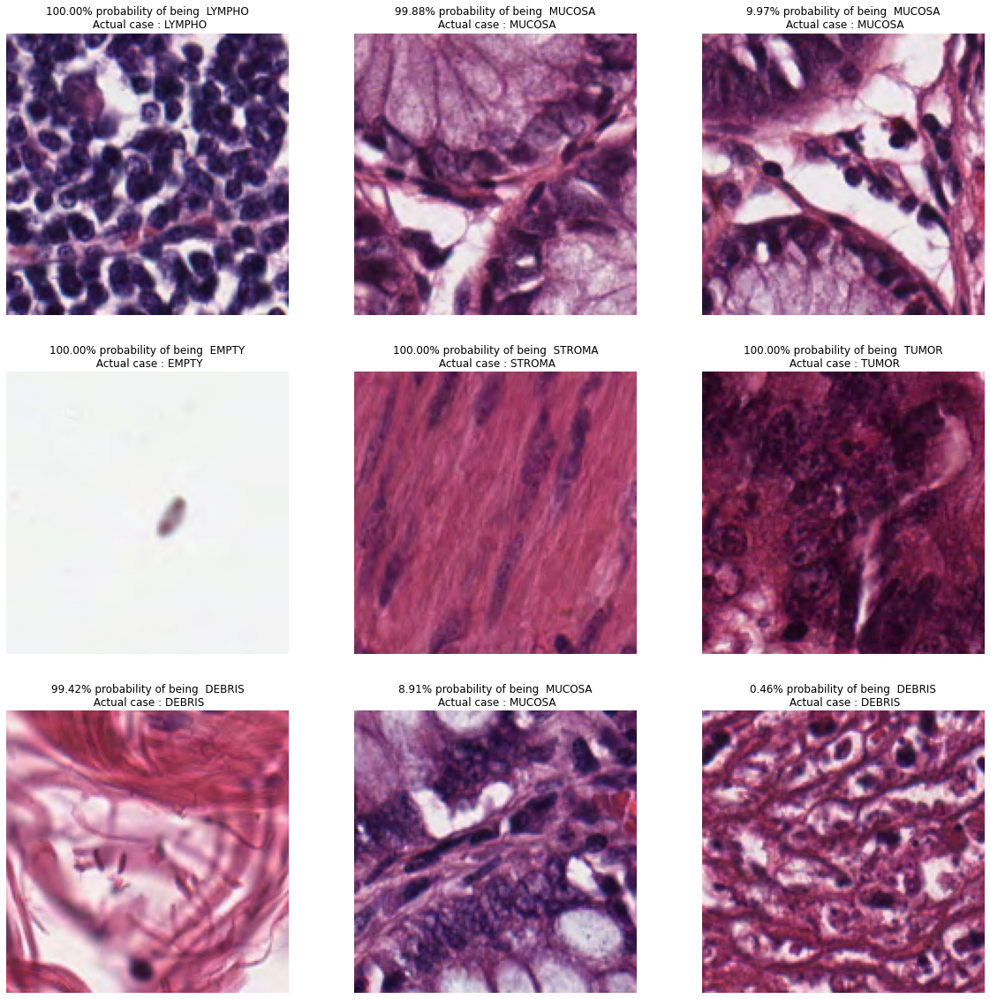

In [ ]:
dic =  {0:'TUMOR', 1:'STROMA', 2:'COMPLEX', 3:'LYMPHO', 4:'DEBRIS', 5:'MUCOSA',
       6:'ADIPOSE', 7:'EMPTY'}
plt.figure(figsize=(20,20))
c = 1
for i in random.sample(range(0, 503), 9):
  
  plt.subplot(3, 3, c)
  c+=1
  for j in range(0,8):
    if y[i][j] == 1:
      
      p = ('{:.2%} probability of being  '.format(preds[i][j])+str(dic.get(predictions[i])))
      actual = ("\n Actual case : "+ str(dic.get(j)))
  plt.title(p + actual)    
  plt.imshow(np.squeeze(x[i]))
  plt.axis('off')
 
      
      

plt.savefig('vgg16-prediction-images.png')  
plt.show()

# Xai methos

## LOAD DATA

In [ ]:

resnet = keras.models.load_model("model-resnet.h5")

vgg16 = keras.models.load_model("vgg16-model.h5")

In [ ]:
import keras
vgg19 = keras.models.load_model("model-vgg19.h5")

In [ ]:
path = 'output/test/01_TUMOR/163B9_CRC-Prim-HE-06_016.tif_Row_1_Col_1.tif'


from tensorflow.keras.preprocessing import image
img = image.load_img(path, target_size=(150, 150),color_mode='rgb')
# Preprocessing the image
img = image.img_to_array(img)
img = img/255
img = np.expand_dims(img, axis=0)
image = np.array(np.squeeze(img), dtype=np.double)


## Grad CAM


In [ ]:
from tensorflow.keras.models import Model
import cv2
import tensorflow as tf
from keras import backend as K

def GradCam(model, img_array, layer_name, eps=1e-8):
    

    gradModel = Model(
			inputs=[model.inputs],
			outputs=[model.get_layer(layer_name).output,
				model.output])
    
    with tf.GradientTape() as tape:
		
      inputs = tf.cast(img_array, tf.float32)
      (convOutputs, predictions) = gradModel(inputs)
      loss = predictions[:, 0]
		
    grads = tape.gradient(loss, convOutputs)
    
    
    castConvOutputs = tf.cast(convOutputs > 0, "float32")
    castGrads = tf.cast(grads > 0, "float32")
    guidedGrads = castConvOutputs * castGrads * grads
	
    convOutputs = convOutputs[0]
    guidedGrads = guidedGrads[0]
  
    weights = tf.reduce_mean(guidedGrads, axis=(0, 1))
    cam = tf.reduce_sum(tf.multiply(weights, convOutputs), axis=-1)
  
    
    (w, h) = (img_array.shape[2], img_array.shape[1])
    heatmap = cv2.resize(cam.numpy(), (w, h))
		
    numer = heatmap - np.min(heatmap)
    denom = (heatmap.max() - heatmap.min()) + eps
    heatmap = numer / denom
    
    return heatmap


def sigmoid(x, a, b, c):
    return c / (1 + np.exp(-a * (x-b)))

def superimpose(img_bgr, cam, thresh, emphasize=False):
    
  
    heatmap = cv2.resize(cam, (img_bgr.shape[1], img_bgr.shape[0]))
    if emphasize:
        heatmap = sigmoid(heatmap, 15, thresh, 1)
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)
    
    hif = .8
    superimposed_img = heatmap * hif + img_bgr
    superimposed_img = np.minimum(superimposed_img, 255.0).astype(np.uint8)  # scale 0 to 255  
    superimposed_img_rgb = cv2.cvtColor(superimposed_img, cv2.COLOR_BGR2RGB)
    
    return superimposed_img_rgb

In [ ]:
def get_layers(model):
  conv2D_layers = [layer.name for layer in reversed(model.layers) if len(layer.output_shape) == 4 and isinstance(layer, tf.keras.layers.Conv2D)]
  activation_layers = [layer.name for layer in reversed(model.layers) if len(layer.output_shape) == 4 ]
  all_layers = [layer.name for layer in reversed(model.layers) if len(layer.output_shape) == 4 ]
  return conv2D_layers, activation_layers,all_layers


In [ ]:
def plot_layer(model , layer, image):

  plt.figure(figsize=(12, 5))
  ax = plt.subplot(1, 2, 1)
  
  out = ('{:.2%} probability of being Tumor case '.format(img_preds[0,0]))
  plt.imshow(image)
  plt.axis('off')
  plt.title("Actual case : Tumor \n"+out)
  ax = plt.subplot(1, 2, 2)
  grad_cam = GradCam(model, np.expand_dims(image, axis=0), layer)
  grad_cam_emphasized = superimpose(image, grad_cam, 0.5, emphasize=False)
  plt.imshow(grad_cam_emphasized)
  plt.axis('off')
  plt.title(layer)
  plt.tight_layout()

### Vgg19 & Grad-Cam

In [ ]:
img_preds= vgg19.predict(img)


In [ ]:
img_preds

array([[9.9633586e-01, 2.1273521e-05, 2.0058751e-03, 8.7713925e-05,
        7.5230106e-05, 1.4734181e-03, 5.2878011e-07, 1.1265488e-07]],
      dtype=float32)

In [ ]:
conv2D_layers, activation_layers,all_layers = get_layers(vgg19)

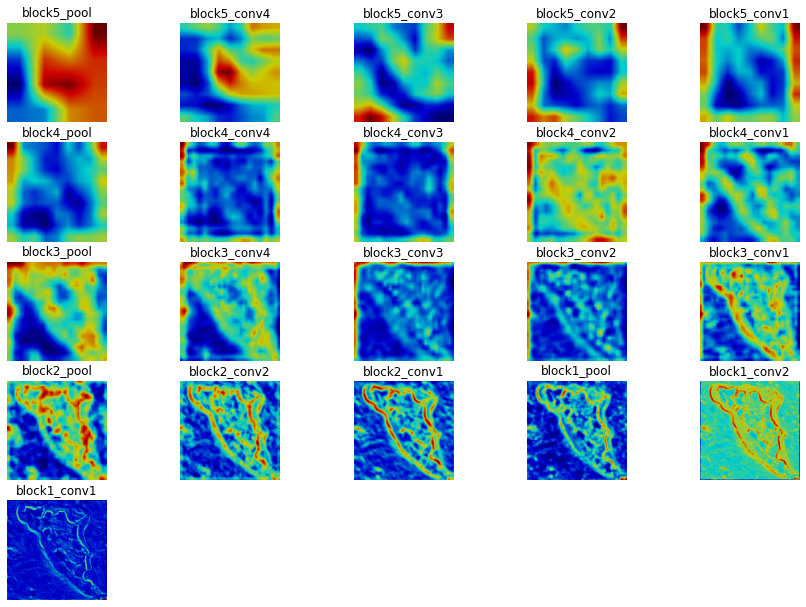

In [ ]:
plt.figure(figsize=(15, 15))
for i, layer in enumerate(get_layers(vgg19)):
  grad_cam = GradCam(vgg19, np.expand_dims(image, axis=0), layer)
  grad_cam_emphasized = superimpose(image, grad_cam, 0.5, emphasize=False)
  ax = plt.subplot(7, 5, i +1)
  plt.imshow(grad_cam_emphasized)
  plt.title(layer)
  plt.axis("off")
plt.show()

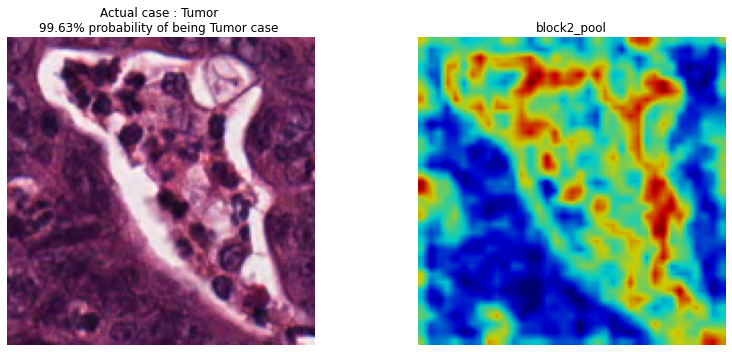

In [ ]:
plot_layer(vgg19 , "block2_pool", image)

### Vgg16 & Grad-Cam

In [ ]:
img_preds= vgg16.predict(img)


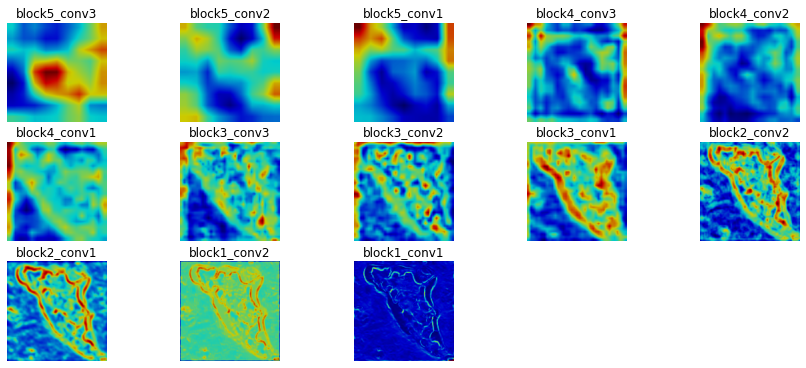

In [ ]:
plt.figure(figsize=(15, 15))
for i, layer in enumerate(get_layers(vgg16)):
  grad_cam = GradCam(vgg16, np.expand_dims(image, axis=0), layer)
  grad_cam_emphasized = superimpose(image, grad_cam, 0.8, emphasize=False)
  ax = plt.subplot(7, 5, i +1)
  plt.imshow(grad_cam_emphasized)
  plt.title(layer)
  plt.axis("off")
plt.show()

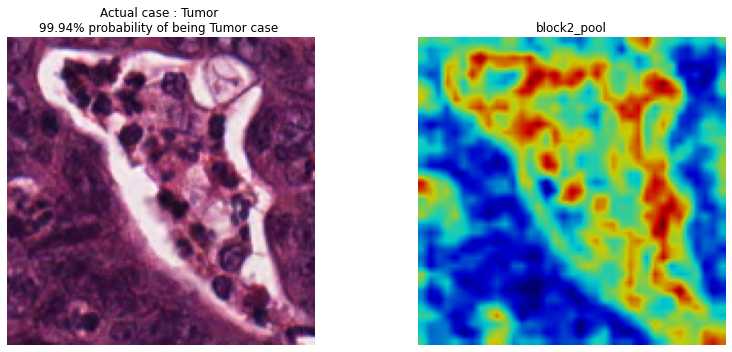

In [ ]:
plot_layer(vgg16 , "block2_pool", image)

# LIME

In [ ]:
!pip install lime

In [ ]:
import lime
from lime import lime_image
from skimage.segmentation import mark_boundaries

In [ ]:
explainer = lime_image.LimeImageExplainer()

In [ ]:
def exp(model,image):
  explanation = explainer.explain_instance(image, 
                                          model.predict, 
                                          top_labels=1, 
                                          hide_color=0, 
                                          num_samples=1000)
  return explanation

In [ ]:
def plot(explanation,image):
  temp, mask = explanation.get_image_and_mask(explanation.top_labels[0], 
                                              positive_only=True, 
                                              num_features=15, 
                                              hide_rest=False)
  plt.figure(figsize=(12, 5))
  ax = plt.subplot(1, 2, 1)
  plt.imshow(image)
  plt.axis('off')
  plt.title('Original Image')
  ax = plt.subplot(1, 2, 2)
  plt.imshow(mark_boundaries(temp , mask))
  plt.axis('off')
  plt.title('Lime result')
  plt.tight_layout()

In [ ]:
def plot_color(explanation,image):
  temp2, mask2 = explanation.get_image_and_mask(explanation.top_labels[0], 
                                            positive_only=False, 
                                            num_features=15, 
                                            hide_rest=False)
  plt.figure(figsize=(12, 5))
  ax = plt.subplot(1, 2, 1)
  out = ('{:.2%} probability of being Tumor case '.format(img_preds[0,0]))
  plt.imshow(image)
  plt.axis('off')
  plt.title("Actual case : Tumor \n"+out)
  ax = plt.subplot(1, 2, 2)
  plt.imshow(mark_boundaries(temp2 , mask2))

  plt.axis('off')
  plt.title('Lime result')
  plt.tight_layout()

## Vgg16 & Lime

In [ ]:
img_preds= vgg16.predict(img)


In [ ]:
explanation = exp(vgg16,image)

  0%|          | 0/1000 [00:00<?, ?it/s]

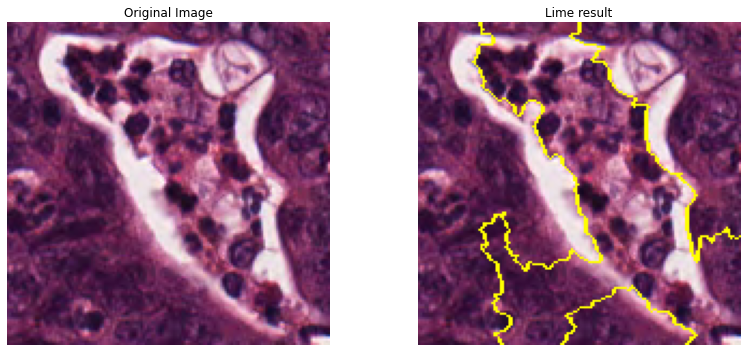

In [ ]:
plot(explanation,image)

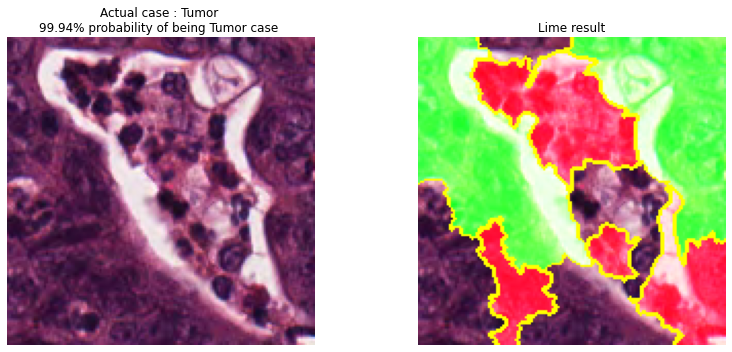

In [ ]:
plot_color(explanation,image)

## Vgg19 & Lime

In [ ]:
img_preds= vgg19.predict(img)


In [ ]:
explanation_vgg19 = exp(vgg19,image)

  0%|          | 0/1000 [00:00<?, ?it/s]

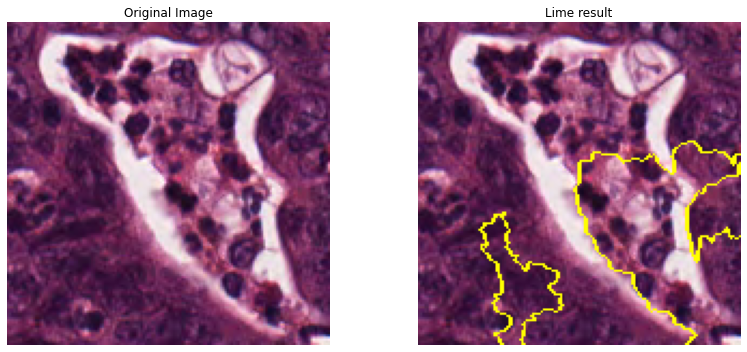

In [ ]:
plot(explanation_vgg19,image)

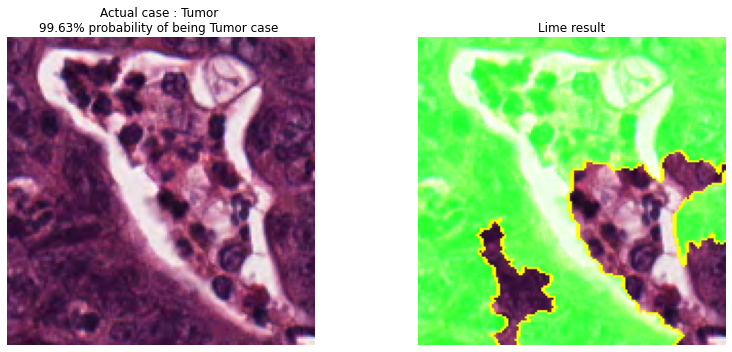

In [ ]:
plot_color(explanation_vgg19,image)

## Resnet & Lime

In [ ]:
img_preds= resnet.predict(img)


In [ ]:
explanation_resnet = exp(resnet,image)

  0%|          | 0/1000 [00:00<?, ?it/s]

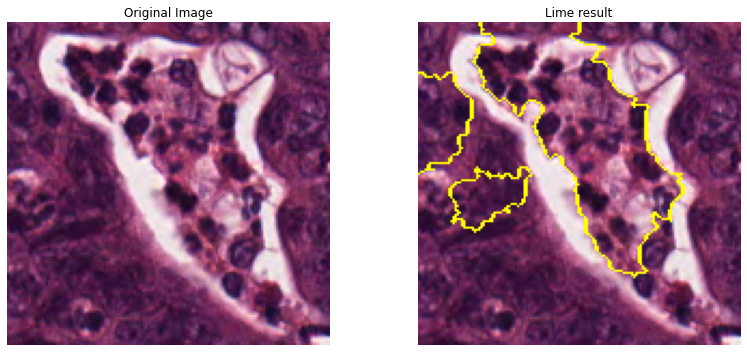

In [ ]:
plot(explanation_resnet,image)

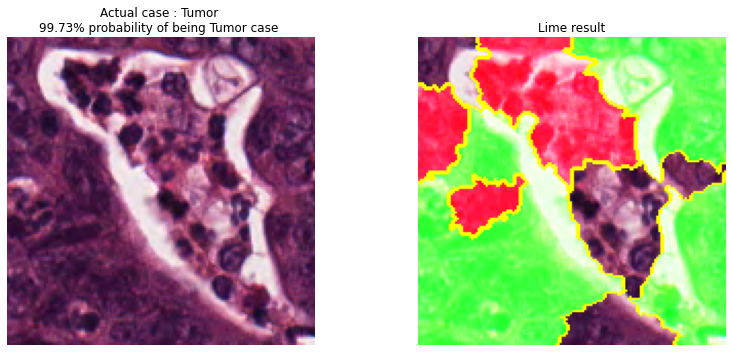

In [ ]:
plot_color(explanation_resnet,image)

#SHAP

In [ ]:
!pip install shap

In [ ]:
import shap

In [ ]:
test.reset()
X_test=np.concatenate([test.next()[0] for i in range(test.__len__())])
y_test=np.concatenate([test.next()[1] for i in range(test.__len__())])
print(X_test.shape)
print(y_test.shape)

(504, 150, 150, 3)
(504, 8)


In [ ]:
train.reset()
X_train=np.concatenate([train.next()[0] for i in range(train.__len__())])
y_train=np.concatenate([train.next()[1] for i in range(train.__len__())])
print(X_train.shape)
print(y_train.shape)

(4000, 150, 150, 3)
(4000, 8)


In [ ]:
X, y = train.next()

In [ ]:
index_names = np.vectorize(lambda x: labels[x])(indexes)

### Vgg16 & Shap

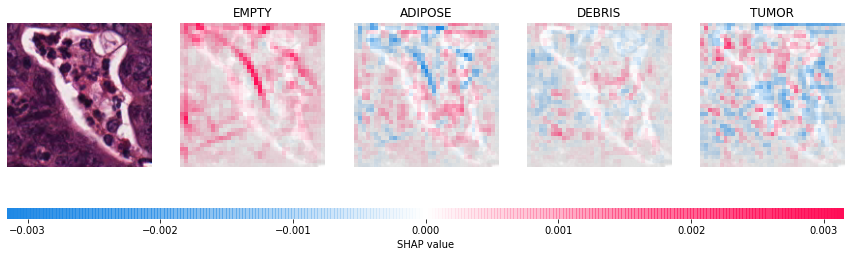

In [ ]:

import numpy as np
import shap
import json
import tensorflow.compat.v1.keras.backend as K
import tensorflow as tf

tf.compat.v1.disable_eager_execution()
import keras

vgg16 = keras.models.load_model("vgg16-model.h5")
to_explain =img



    
# explain how the input to the 7th layer of the model explains the top two classes
def map2layer(x, layer):
    feed_dict = dict(zip([vgg16.layers[0].input], [x.copy()]))
    return K.get_session().run(vgg16.layers[layer].input, feed_dict)
e = shap.GradientExplainer((vgg16.layers[7].input, vgg16.layers[-1].output), map2layer(X_test.copy(), 7))
shap_values,indexes = e.shap_values(map2layer(to_explain/255, 7), ranked_outputs=4)
index_names = np.vectorize(lambda x: labels[x])(indexes)
# get the names for the classes

# plot the explanations
shap.image_plot(shap_values, to_explain,index_names)

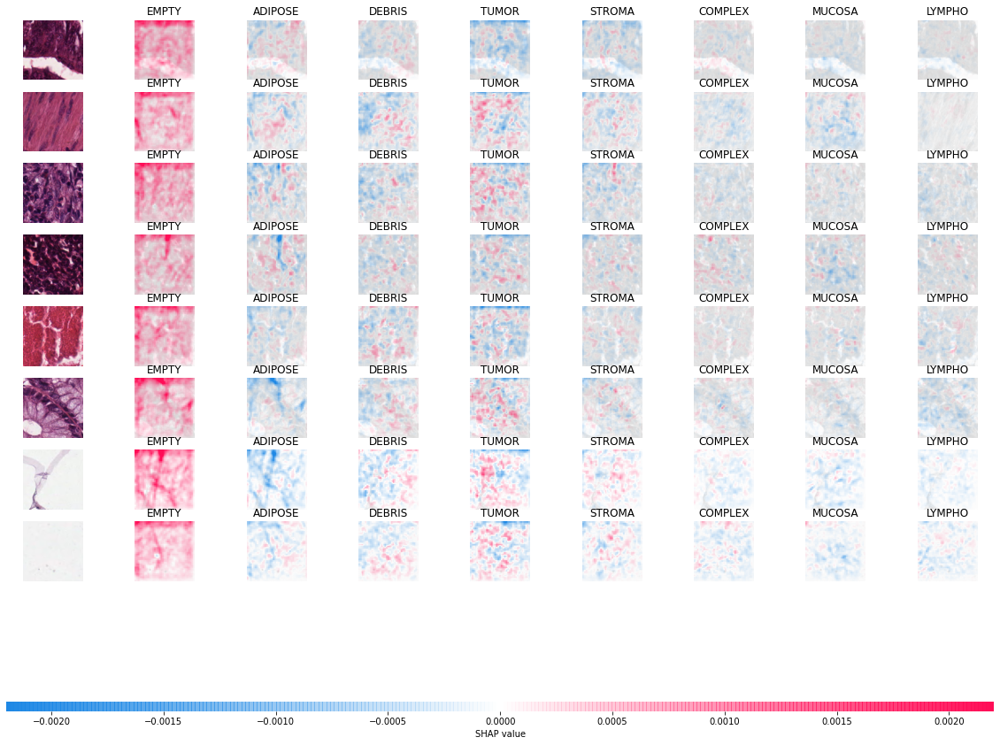

In [ ]:

import numpy as np
import shap
import json
import tensorflow.compat.v1.keras.backend as K
import tensorflow as tf

tf.compat.v1.disable_eager_execution()
import keras

vgg16 = keras.models.load_model("vgg16-model.h5")
to_explain = X_test[[1,65,129,195,259,321,384,490 ]]



    
# explain how the input to the 7th layer of the model explains the top two classes
def map2layer(x, layer):
    feed_dict = dict(zip([vgg16.layers[0].input], [x.copy()]))
    return K.get_session().run(vgg16.layers[layer].input, feed_dict)
e = shap.GradientExplainer((vgg16.layers[7].input, vgg16.layers[-1].output), map2layer(X_test.copy(), 7))
shap_values,indexes = e.shap_values(map2layer(to_explain/255, 7), ranked_outputs=8)
index_names = np.vectorize(lambda x: labels[x])(indexes)
# get the names for the classes

# plot the explanations
shap.image_plot(shap_values, to_explain,index_names)

### Vgg19 & Shap

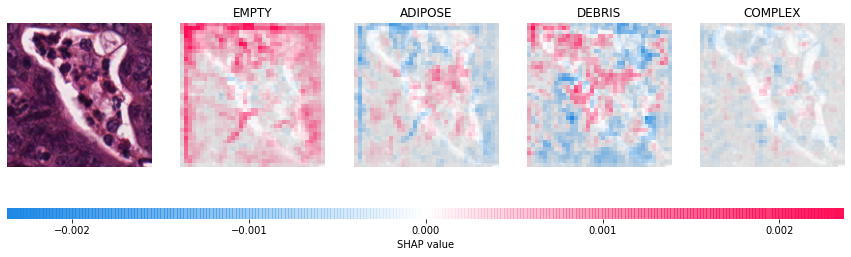

In [ ]:

import numpy as np
import shap
import json
import tensorflow.compat.v1.keras.backend as K
import tensorflow as tf

tf.compat.v1.disable_eager_execution()
import keras

vgg19 = keras.models.load_model("model-vgg19.h5")
to_explain = img


    
def map2layer(x, layer):
    feed_dict = dict(zip([vgg19.layers[0].input], [x.copy()]))
    return K.get_session().run(vgg19.layers[layer].input, feed_dict)
e = shap.GradientExplainer((vgg19.layers[7].input, vgg19.layers[-1].output), map2layer(X_test.copy(), 7))
shap_values,indexes = e.shap_values(map2layer(to_explain/255, 7), ranked_outputs=4)
index_names = np.vectorize(lambda x: labels[x])(indexes)

shap.image_plot(shap_values, to_explain,index_names)

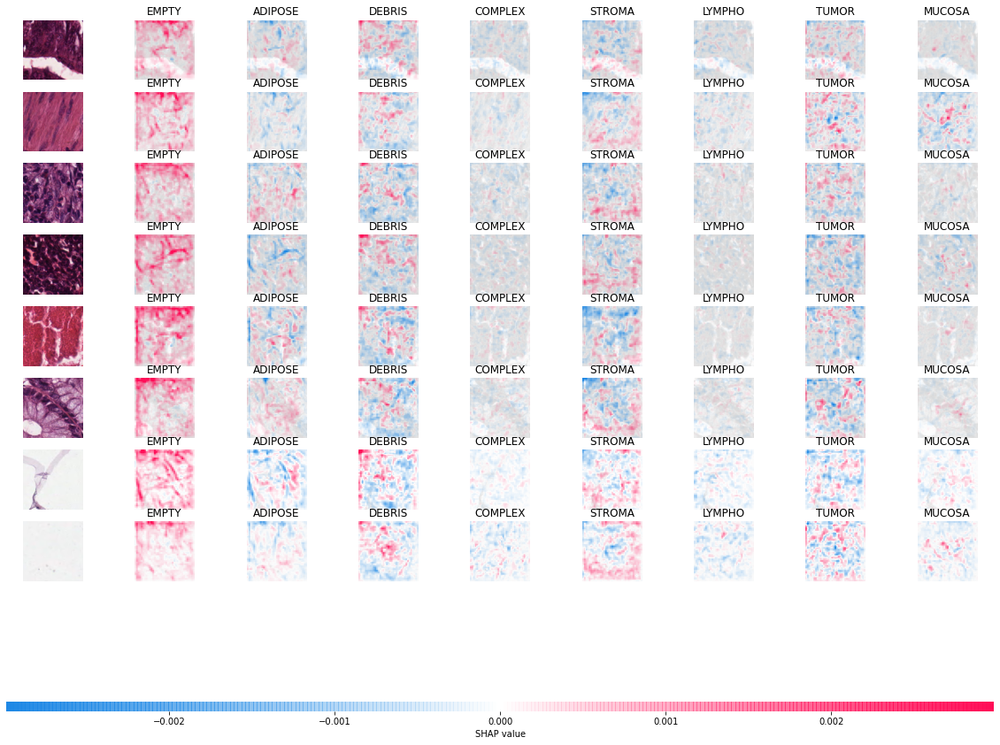

In [ ]:

import numpy as np
import shap
import json
import tensorflow.compat.v1.keras.backend as K
import tensorflow as tf

tf.compat.v1.disable_eager_execution()
import keras

vgg19 = keras.models.load_model("model-vgg19.h5")
to_explain = X_test[[1,65,129,195,259,321,384,490 ]]



    
# explain how the input to the ith layer of the model explains the top  classes
def map2layer(x, layer):
    feed_dict = dict(zip([vgg19.layers[0].input], [x.copy()]))
    return K.get_session().run(vgg19.layers[layer].input, feed_dict)
e = shap.GradientExplainer((vgg19.layers[7].input, vgg19.layers[-1].output), map2layer(X_test.copy(), 7))
shap_values,indexes = e.shap_values(map2layer(to_explain/255, 7), ranked_outputs=8)
index_names = np.vectorize(lambda x: labels[x])(indexes)

shap.image_plot(shap_values, to_explain,index_names)